**<h1> Manipulating Images </h1>**


Estimated time needed: **60** minutes


<h2>Objectives</h2>


In this lab, you will learn how to manipulate images, both as arrays and PIL image objects. You will learn how to copy an image to avoid aliasing. We will cover flipping images and cropping images. You will also learn to change pixel images; this will allow you to draw shapes, write text and superimpose images over other images.


<ul>
    <li><a href='#MI'>Manipulating Images </a>
        <ul>
            <li>Copying Images  </li>
            <li>Fliping Images </li>
            <li>Cropping an Image </li>
            <li>Changing Specific Image Pixels </li>
     
  
    
</ul>


----


Download the images for the lab:


In [1]:
!wget https://cf-courses-data.s3.us.cloud-object-storage.appdomain.cloud/IBMDeveloperSkillsNetwork-CV0101EN-SkillsNetwork/images%20/images_part_1/cat.png -O cat.png
!wget https://cf-courses-data.s3.us.cloud-object-storage.appdomain.cloud/IBMDeveloperSkillsNetwork-CV0101EN-SkillsNetwork/images%20/images_part_1/lenna.png -O lenna.png
!wget https://cf-courses-data.s3.us.cloud-object-storage.appdomain.cloud/IBMDeveloperSkillsNetwork-CV0101EN-SkillsNetwork/images%20/images_part_1/baboon.png -O baboon.png

'wget' is not recognized as an internal or external command,
operable program or batch file.
'wget' is not recognized as an internal or external command,
operable program or batch file.
'wget' is not recognized as an internal or external command,
operable program or batch file.


We will be using these imported functions in the lab:


In [2]:
import matplotlib.pyplot as plt # Import thư viện matplotlib để hiển thị hình ảnh
from PIL import Image           # Import thư viện PIL để xử lý hình ảnh
import numpy as np              # Import thư viện numpy để xử lý mảng

## Copying Images


If you want to reassign an array to another variable, you should use the `copy` method. 


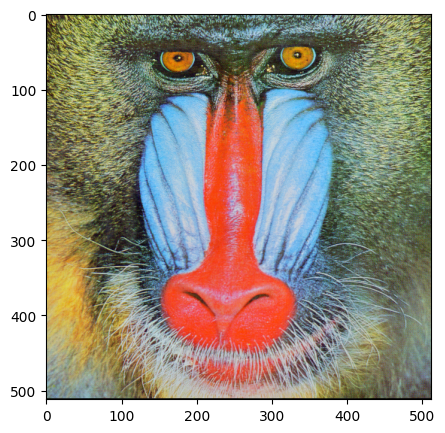

In [3]:
baboon = np.array(Image.open('baboon.png'))         # Mở hình ảnh baboon.png và chuyển đổi nó thành mảng numpy
plt.figure(figsize=(5,5))                           # Thiết lập hình ảnh mới với kích thước 5x5 inch
plt.imshow(baboon)                                  # Hiển thị hình ảnh baboon
plt.show()                                          # Hiển thị ảnh đã được thiết lập

If we do not apply the method `copy()`, the two variables would point to the same location in memory:


In [4]:
A = baboon          # Tạo một bản sao của ảnh khi không có copy() với tên baboon và gán nó cho biến A

We use the  `id`  function to find a variable's memory address; we see the objects in the memory space which the variables `A` and `baboon` point to are the same.


In [5]:
id(A) == id(baboon)     # Sử dụng id() để kiểm tra xem A và baboon có cùng địa chỉ bộ nhớ không

True

However, if we apply method `copy()`, their memory addresses are different.


In [6]:
B = baboon.copy()           # Tạo một bản sao của ảnh baboon sử dụng phương thức copy() và gán nó cho biến B
id(B)==id(baboon)           # Sử dụng id() để kiểm tra xem B và baboon có cùng địa chỉ bộ nhớ không

False

There may be unexpected behaviours when two variables point to the same object in memory. Consider the array `baboon`. If we set all its entries to zero, all entires in `A` will become zero as well. However, as `baboon` and `B` points to different objects, the values in `B` will not be affected. 


In [7]:
baboon[:,:,] = 0   # Đặt tất cả các giá trị pixel màu trong mảng baboon thành giá trị 0 (đen)

We can compare the variables <code>baboon</code> and array <code>A</code>:


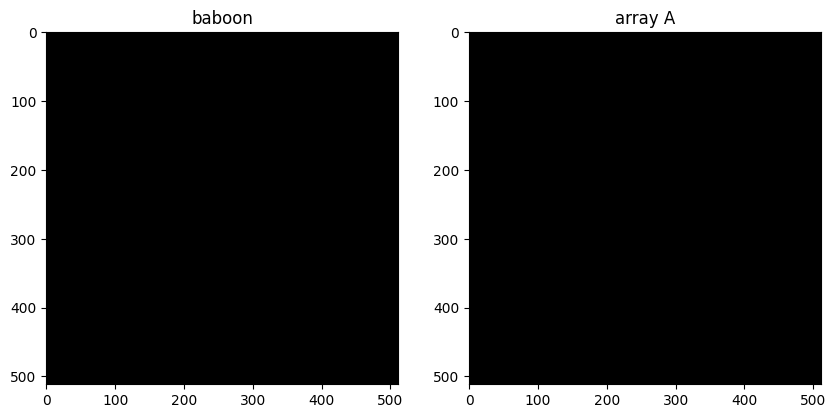

In [8]:
plt.figure(figsize=(10,10))         # Thiết lập hình ảnh mới với kích thước 10x10 inch
plt.subplot(121)                    # Thiết lập lưới con với 1 hàng và 2 cột, chọn vị trí đầu tiên
plt.imshow(baboon)                  # Hiển thị hình ảnh baboon đã bị thay đổi
plt.title("baboon")                 # Tiêu đề cho hình ảnh baboon
plt.subplot(122)                    # Chọn vị trí thứ hai trong lưới con
plt.imshow(A)                       # Hiển thị hình ảnh A
plt.title("array A")                # Tiêu đề cho hình ảnh A
plt.show()                          # Hiển thị cả hai hình ảnh đã được thiết lập

We see they are the same. This behaviour is called aliasing. Aliasing happens whenever one variable's value is assigned to another variable. Variables are references to values on the memory. 

We can also compare <code>baboon</code> and array <code>B</code>:


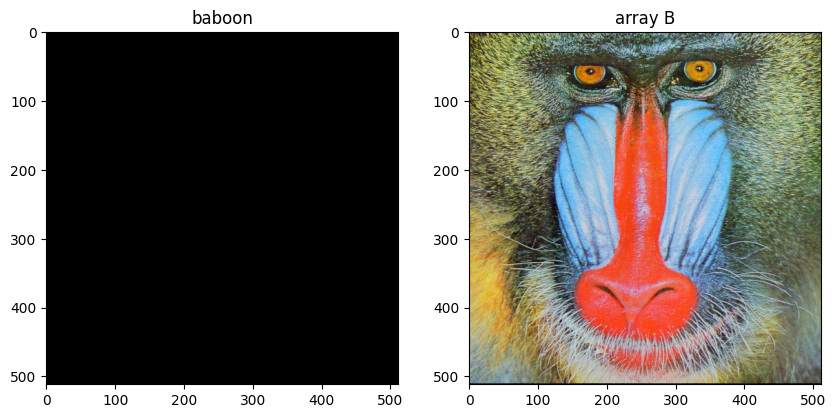

In [9]:
plt.figure(figsize=(10,10))        # Thiết lập hình ảnh mới với kích thước 10x10 inch
plt.subplot(121)                   # Thiết lập lưới con với 1 hàng và 2 cột, chọn vị trí đầu tiên
plt.imshow(baboon)                 # Hiển thị hình ảnh baboon đã bị thay đổi
plt.title("baboon")                # Tiêu đề cho hình ảnh baboon
plt.subplot(122)                   # Chọn vị trí thứ hai trong lưới con
plt.imshow(B)                      # Hiển thị hình ảnh B
plt.title("array B")               # Tiêu đề cho hình ảnh B
plt.show()                         # Hiển thị cả hai hình ảnh đã được thiết lập


If a PIL function does not return a new image, the same principle applies. We will go over some examples later on. 


## Flipping Images 


Flipping images involves reordering the indices of the pixels such that it changes the orientation of the image. Consider the following image:


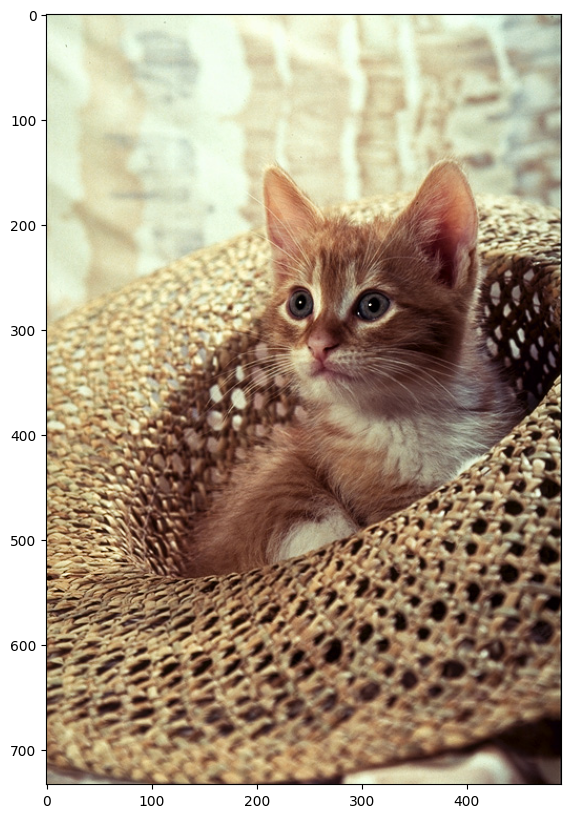

In [10]:
image = Image.open("cat.png")     # Mở hình ảnh cat.png sử dụng PIL và gán nó cho biến image
plt.figure(figsize=(10,10))       # Thiết lập hình ảnh mới với kích thước 10x10 inch
plt.imshow(image)                 # Hiển thị hình ảnh cat
plt.show()                        # Hiển thị ảnh đã được thiết lập

We can cast it to an array and find its shape:


In [11]:
array = np.array(image)                            # Chuyển đổi hình ảnh cat thành mảng numpy và gán nó cho biến array
width, height, C = array.shape                     # Lấy kích thước của mảng và gán nó cho các biến width, height và C
print('width, height, C', width, height, C)        # In ra kích thước của mảng

width, height, C 733 490 3


Let's flip, i.e rotate vertically, the image. Let's try the traditional approach. First, we create an array of the same size with datatype <code>np.uint8</code>.


In [12]:
array_flip = np.zeros((width, height, C), dtype=np.uint8)  # Tạo một mảng numpy mới với cùng kích thước như array và kiểu dữ liệu uint8, khởi tạo tất cả giá trị bằng 0

We assign the first row of pixels of the original array to the new array’s last row. We repeat the process for every row, incrementing the row number from the original array and decreasing the new array’s row index to assign the pixels accordingly. After excecuting the for loop below, `array_flip` will become the flipped image. 


In [13]:
for i,row in enumerate(array):                  # Lặp qua từng hàng trong mảng array với chỉ số i và giá trị row
    array_flip[width - 1 - i, :, :] = row       # Gán hàng i của array vào hàng tương ứng từ dưới lên trong array_flip

<code>PIL</code> has several ways to flip an image, for example, we can use the <code>ImageOps</code> module:


In [14]:
from PIL import ImageOps     # Import thư viện ImageOps từ PIL để thao tác với hình ảnh

The `flip()` method of `ImageOps` module flips the image. The `mirror()` method will mirror  the image:


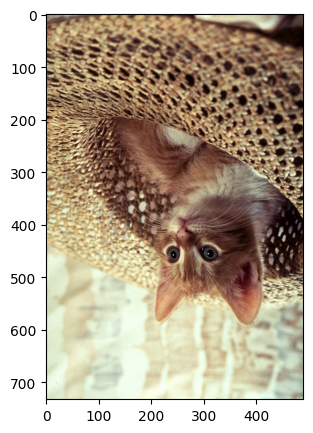

In [15]:
im_flip = ImageOps.flip(image)              # Sử dụng ImageOps.flip để lật hình ảnh cat theo chiều dọc và gán nó cho biến im_flip
plt.figure(figsize=(5,5))                   # Thiết lập hình ảnh mới với kích thước 5x5 inch
plt.imshow(im_flip)                         # Hiển thị hình ảnh đã lật
plt.show()                                  # Hiển thị ảnh đã được thiết lập

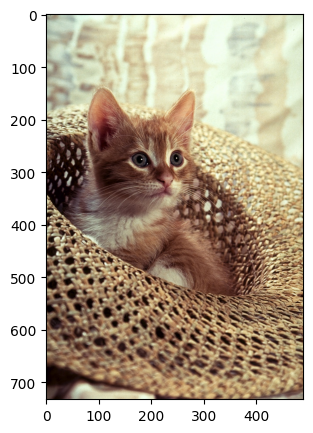

In [16]:
im_mirror = ImageOps.mirror(image)        # Sử dụng ImageOps.mirror để lật hình ảnh cat theo chiều ngang và gán nó cho biến im_mirror
plt.figure(figsize=(5,5))                 # Thiết lập hình ảnh mới với kích thước 5x5 inch
plt.imshow(im_mirror)                     # Hiển thị hình ảnh đã lật ngang
plt.show()                                # Hiển thị ảnh đã được thiết lập

We can use  the <code>transpose()</code> method; the parameter is an integer indicating what type of transposition we would like to perform. For example, we can flip the image using a value of `1`.


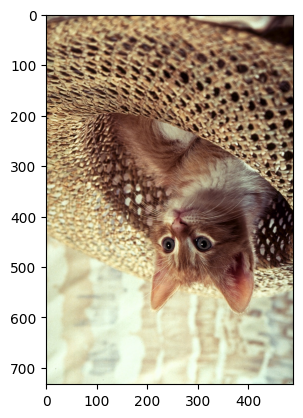

In [17]:
im_flip = image.transpose(1)             # Sử dụng phương thức transpose với tham số 1 để lật hình ảnh cat theo chiều dọc và gán nó cho biến im_flip
plt.imshow(im_flip)                      # Hiển thị hình ảnh đã lật
plt.show()                               # Hiển thị ảnh đã được thiết lập

The Image module has built-in attributes that describe the type of flip. The values are just integers. Several are shown in the following <code>dict</code>:


In [18]:
# Tạo một từ điển ánh xạ các phương thức lật và xoay của PIL
flip = {"FLIP_LEFT_RIGHT": Image.FLIP_LEFT_RIGHT,       # Phương thức lật theo chiều ngang
        "FLIP_TOP_BOTTOM": Image.FLIP_TOP_BOTTOM,       # Phương thức lật theo chiều dọc
        "ROTATE_90": Image.ROTATE_90,                   # Phương thức xoay 90 độ
        "ROTATE_180": Image.ROTATE_180,                 # Phương thức xoay 180 độ
        "ROTATE_270": Image.ROTATE_270,                 # Phương thức xoay 270 độ
        "TRANSPOSE": Image.TRANSPOSE,                   # Phương thức chuyển vị
        "TRANSVERSE": Image.TRANSVERSE}                 # Phương thức chuyển vị ngược

We see the values are integers.


In [19]:
flip["FLIP_LEFT_RIGHT"]   # Phương thức lật theo chiều ngang

0

We can plot each of the outputs using the different  parameter values:


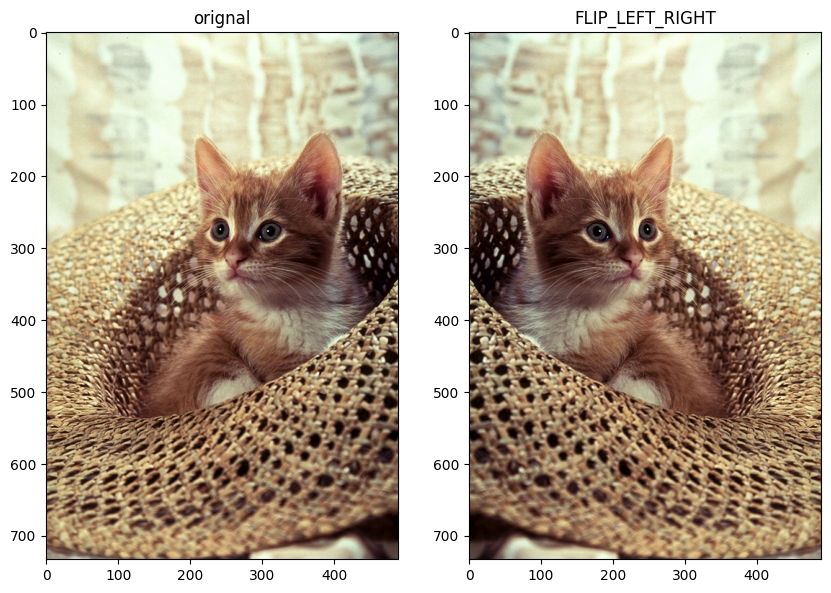

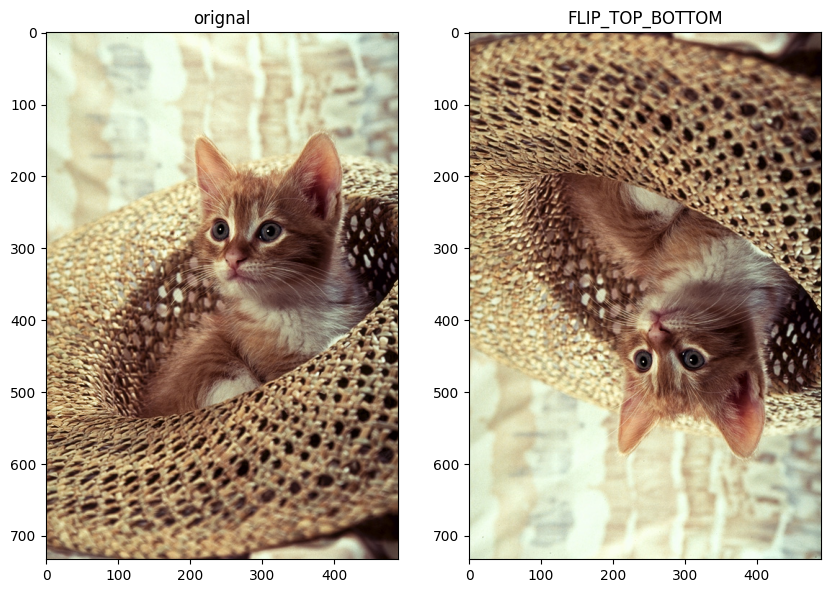

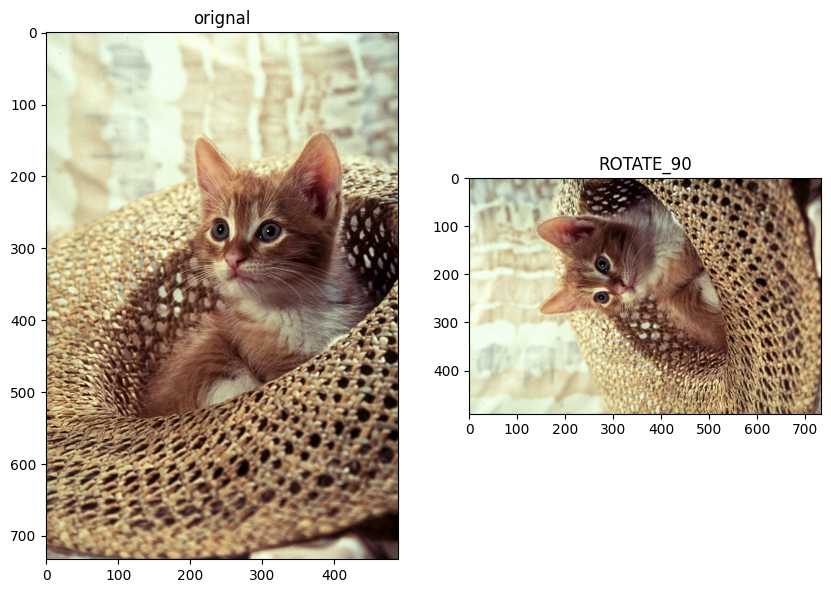

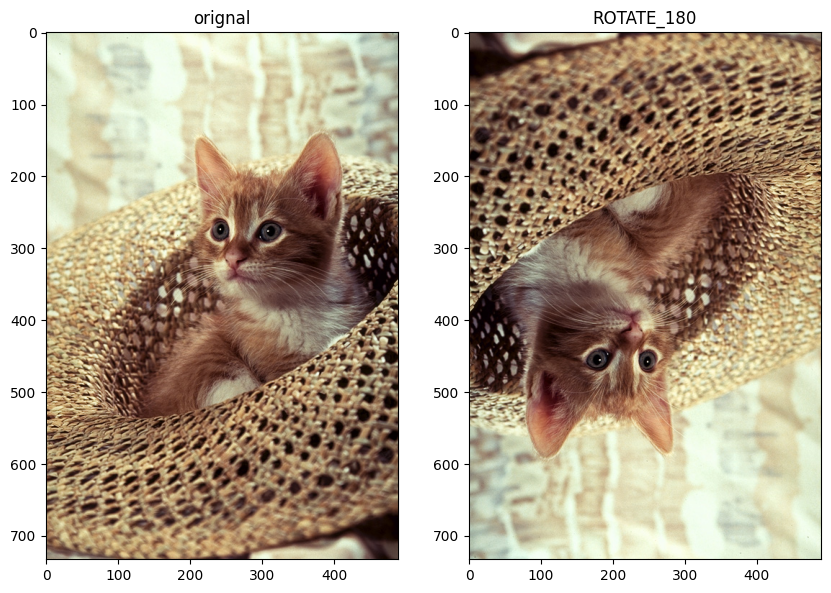

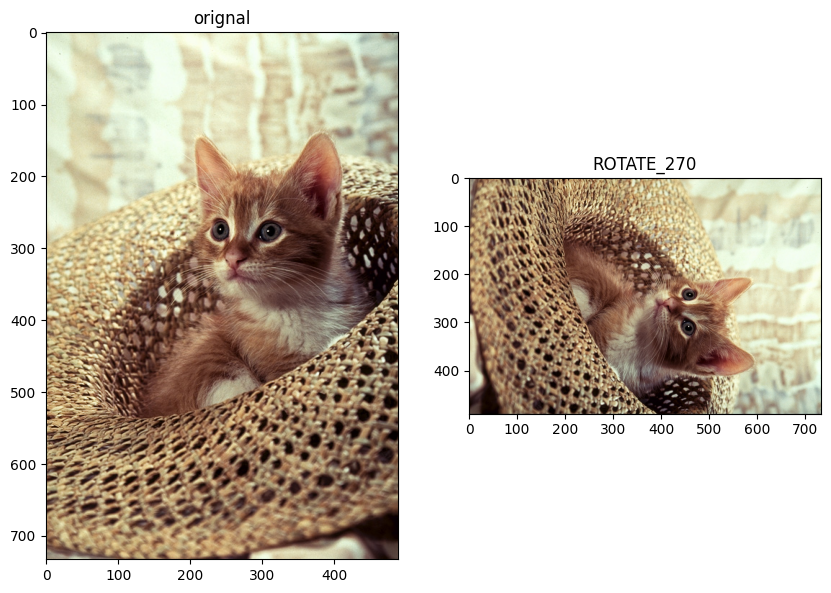

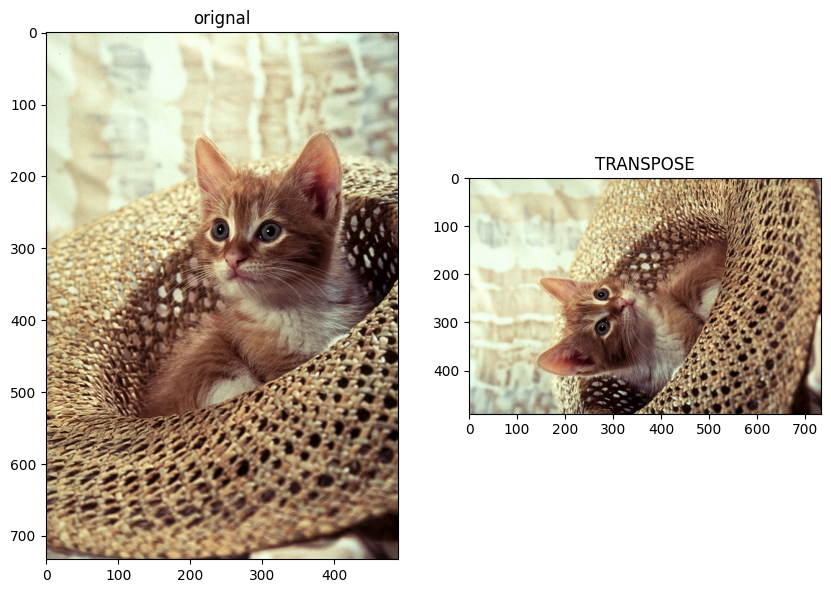

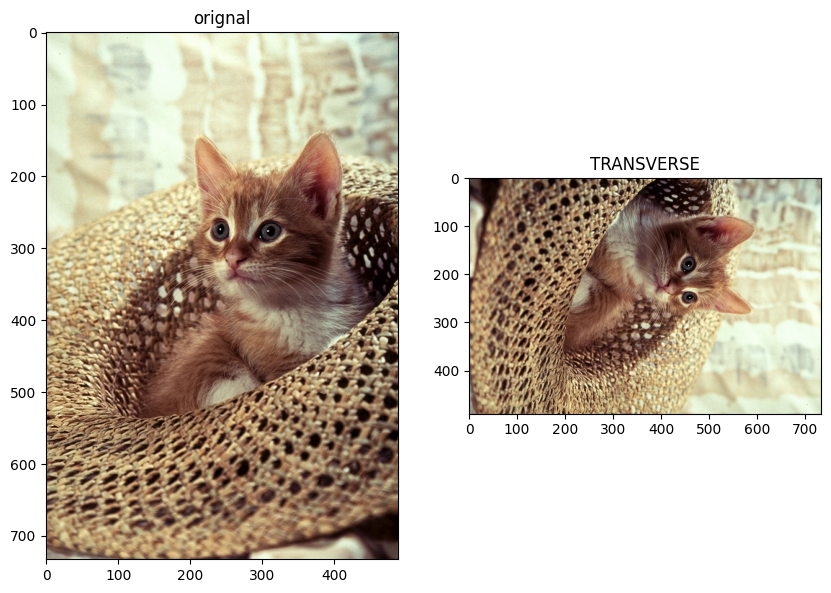

In [20]:
for key, values in flip.items():            # Lặp qua từng cặp key-value trong từ điển flip
    plt.figure(figsize=(10,10))             # Thiết lập hình ảnh mới với kích thước 10x10 inch
    plt.subplot(1,2,1)                      # Thiết lập lưới con với 1 hàng và 2 cột, chọn vị trí đầu tiên
    plt.imshow(image)                       # Hiển thị hình ảnh cat gốc  
    plt.title("orignal")                    # Hiển thị hình ảnh gốc với tiêu đề "original"
    plt.subplot(1,2,2)                      # Chọn vị trí thứ hai trong lưới con
    plt.imshow(image.transpose(values))     # Hiển thị hình ảnh cat đã được lật/xoay theo phương thức tương ứng
    plt.title(key)                          # Hiển thị tiêu đề tương ứng với phương thức lật/xoay
    plt.show()                              # Hiển thị cả hai hình ảnh đã được thiết lập

 ## Cropping an Image


Cropping is the act of "cutting out" a part of an image and throwing out the rest. We can perform cropping using array slicing. 

Let start with a vertical crop: the variable `upper` is the index of the first row that we would like to include in the image, the variable `lower` is the index of the last row we would like to include. We then perform array slicing to obtain the new image. 


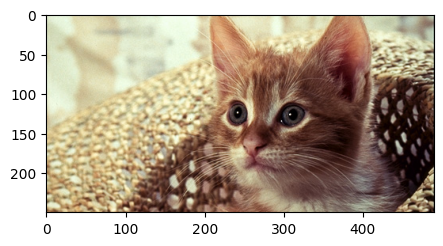

In [21]:
upper = 150                           # Xác định vị trí cắt trên
lower = 400                           # Xác định vị trí cắt dưới
crop_top = array[upper: lower,:,:]    # Cắt mảng array từ hàng upper đến hàng lower, giữ nguyên tất cả các cột và kênh màu, gán nó cho biến crop_top
plt.figure(figsize=(5,5))             # Thiết lập hình ảnh mới với kích thước 5x5 inch
plt.imshow(crop_top)                  # Hiển thị hình ảnh đã cắt từ mảng array
plt.show()                            # Hiển thị ảnh đã được thiết lập  

Consider the array `crop_top`: we can also crop horizontally. The variable `right` is the index of the first column that we would like to include in the image and the variable `left` is the index of the last column we would like to include in the image.


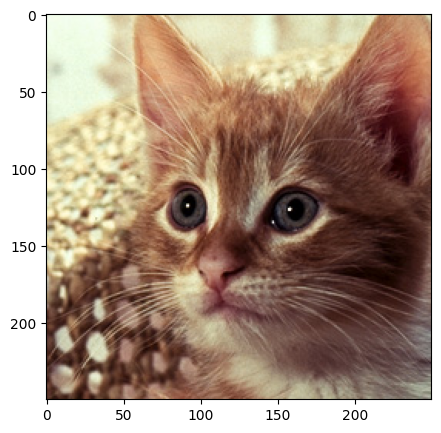

In [22]:
left = 150                                       # Xác định vị trí cắt bên trái
right = 400                                      # Xác định vị trí cắt bên phải
crop_horizontal = crop_top[: ,left:right,:]      # Cắt mảng crop_top từ cột left đến cột right, giữ nguyên tất cả các hàng và kênh màu, gán nó cho biến crop_horizontal
plt.figure(figsize=(5,5))                        # Thiết lập hình ảnh mới với kích thước 5x5 inch
plt.imshow(crop_horizontal)                      # Hiển thị hình ảnh đã cắt ngang từ mảng crop_top
plt.show()                                       # Hiển thị ảnh đã được thiết lập

You can crop the PIL image using the <code>crop()</code> method, using the parameters from above Set the cropping area with <code>box=(left, upper, right, lower)</code>.


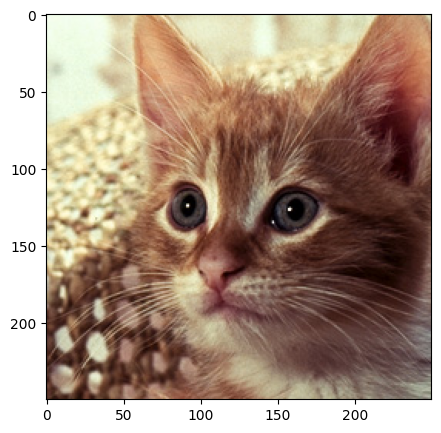

In [23]:
image = Image.open("cat.png")                           # Mở hình ảnh cat.png sử dụng PIL và gán nó cho biến image
crop_image = image.crop((left, upper, right, lower))    # Sử dụng phương thức crop để cắt hình ảnh với tọa độ (left, upper, right, lower) và gán nó cho biến crop_image
plt.figure(figsize=(5,5))                               # Thiết lập hình ảnh mới với kích thước 5x5 inch
plt.imshow(crop_image)                                  # Hiển thị hình ảnh đã cắt
plt.show()                                              # Hiển thị ảnh đã được thiết lập

We can also flip the new image:


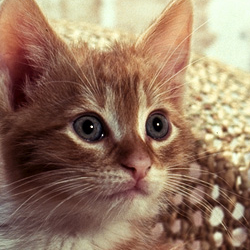

In [24]:
crop_image = crop_image.transpose(Image.FLIP_LEFT_RIGHT)  # Lật hình ảnh đã cắt theo chiều ngang sử dụng phương thức transpose với tham số Image.FLIP_LEFT_RIGHT và gán nó cho biến
crop_image                                                # Hiển thị hình ảnh cắt đã được lật

## Changing Specific Image Pixels


We can change specific image pixels using  array indexing; for example, we can set  all the green and blue channels in the original image we cropped to zero:


In [25]:
array_sq = np.copy(array)                      # Tạo một bản sao của mảng array và gán nó cho biến array_sq
array_sq[upper:lower, left:right, 1:3] = 0     # Đặt các giá trị kênh màu xanh lá cây và xanh dương trong vùng cắt thành 0 (đen)

We can compare the results with the new image. 


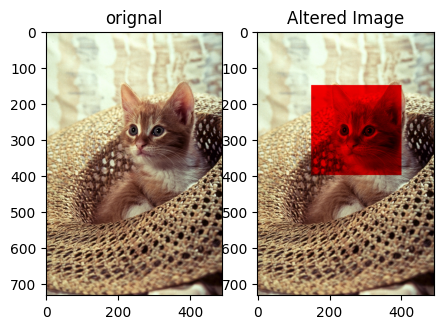

In [26]:
plt.figure(figsize=(5,5))        # Thiết lập hình ảnh mới với kích thước 5x5 inch
plt.subplot(1,2,1)               # Thiết lập lưới con với 1 hàng và 2 cột, chọn vị trí đầu tiên
plt.imshow(array)                # Hiển thị hình ảnh cat gốc
plt.title("orignal")             # Hiển thị hình ảnh gốc với tiêu đề "original"
plt.subplot(1,2,2)               # Chọn vị trí thứ hai trong lưới con
plt.imshow(array_sq)             # Hiển thị hình ảnh đã được chỉnh sửa
plt.title("Altered Image")       # Hiển thị tiêu đề cho hình ảnh đã được chỉnh sửa
plt.show()                       # Hiển thị cả hai hình ảnh đã được thiết lập

We can also use the `ImageDraw` module from `PIL` library, which provides simple 2D graphics for Image objects 


In [27]:
from PIL import ImageDraw     # Import thư viện ImageDraw từ PIL để vẽ trên hình ảnh

We will copy the image object:


In [28]:
image_draw = image.copy()     # Tạo một bản sao của hình ảnh gốc để vẽ lên và gán nó cho biến image_draw           

The draw constructor creates an object that can be used to draw in the given image. The input <code>im</code> is the image we would like to draw in.



In [29]:
image_fn = ImageDraw.Draw(im=image_draw)          # Tạo một đối tượng ImageDraw để vẽ trên hình ảnh image_draw và gán nó cho biến image_fn

Whatever method we apply to the object <code>image_fn</code>, will change the image object <code>image_draw</code>.


We can draw a rectangle using the <code>rectangle</code> function, two important parameters include: <code>xy</code> – the coordinates bounding box  and <code>fill</code> – Color of the rectangle.


In [30]:
shape = [left, upper, right, lower]            # Xác định hình chữ nhật với tọa độ (left, upper, right, lower)
image_fn.rectangle(xy=shape,fill="red")        # Vẽ một hình chữ nhật màu đỏ trên hình ảnh tại vị trí xác định bởi shape

We can plot the image.


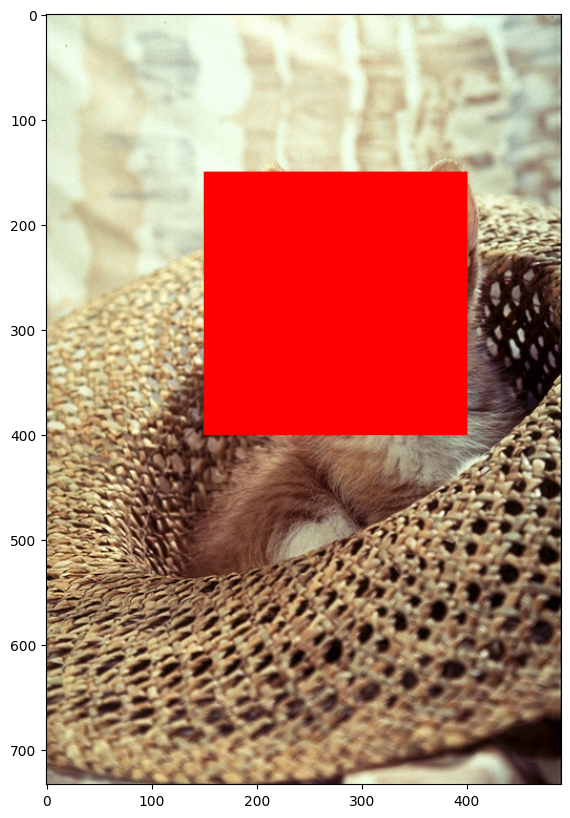

In [31]:
plt.figure(figsize=(10,10))          # Thiết lập hình ảnh mới với kích thước 10x10 inch
plt.imshow(image_draw)               # Hiển thị hình ảnh đã vẽ hình chữ nhật đỏ lên
plt.show()                           # Hiển thị ảnh đã được thiết lập

There are other shapes we can use. For example, we can also overlay text on an image: we use the ImageFont module to obtain  bitmap fonts.


In [32]:
from PIL import Image, ImageFont             # Import thư viện Image và ImageFont từ PIL để xử lý hình ảnh và phông chữ

We use the text method to place the text on the image. The parameters include `xy` (the top-left anchor coordinates of the text), the parameter `text` (the text to be drawn), and `fill` (the color to use for the text).


In [33]:
image_fn.text(xy=(0,0),text="box",fill=(0,0,0))     # Vẽ chữ "box" màu đen tại vị trí (0,0) trên hình ảnh sử dụng đối tượng ImageDraw

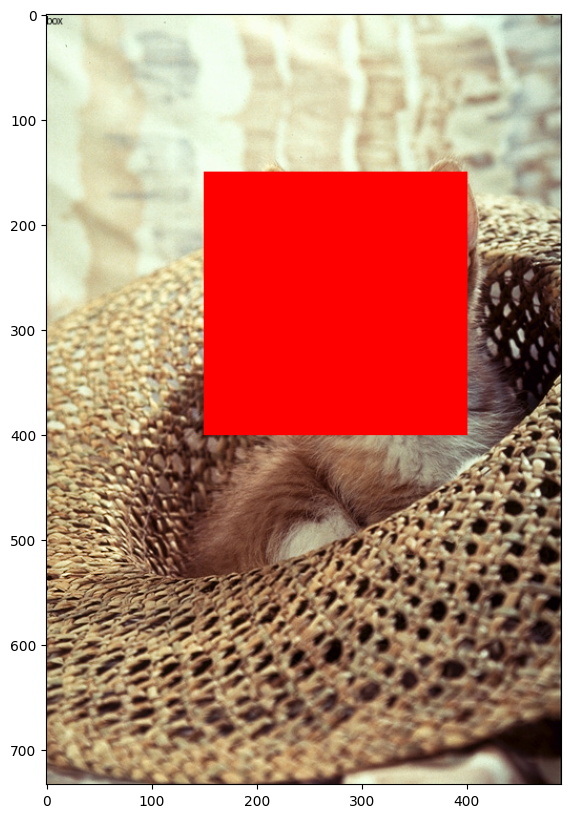

In [34]:
plt.figure(figsize=(10,10))            # Thiết lập hình ảnh mới với kích thước 10x10 inch
plt.imshow(image_draw)                 # Hiển thị hình ảnh đã vẽ chữ lên
plt.show()                             # Hiển thị ảnh đã được thiết lập

We can overlay or paste one image over another by reassigning the pixel for one array to the next. Consider the following image array:


In [35]:
image_lenna = Image.open("lenna.png")                 # Mở hình ảnh lenna.png sử dụng PIL và gán nó cho biến image_lenna
array_lenna = np.array(image_lenna)                   # Chuyển đổi hình ảnh lenna thành mảng numpy và gán nó cho biến array_lenna

We can reassign the pixel values as follows:


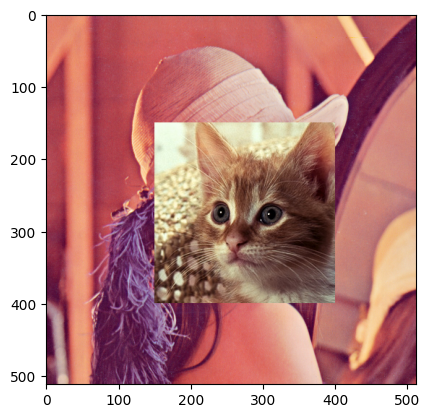

In [36]:
array_lenna[upper:lower,left:right,:]=array[upper:lower,left:right,:]     # Thay thế vùng hình chữ nhật trong array_lenna bằng vùng tương ứng từ mảng array
plt.imshow(array_lenna)                                                   # Hiển thị hình ảnh lenna đã được chỉnh sửa
plt.show()                                                                # Hiển thị ảnh đã được thiết lập

In the same manner, the <code>paste()</code> method allows you to overlay one image over another, with the input being the image you would like to overlay. The parameter box is the left and upper coordinate of the image:


In [37]:
image_lenna.paste(crop_image, box=(left,upper))         # Dán hình ảnh crop_image vào hình ảnh lenna tại vị trí (left, upper)

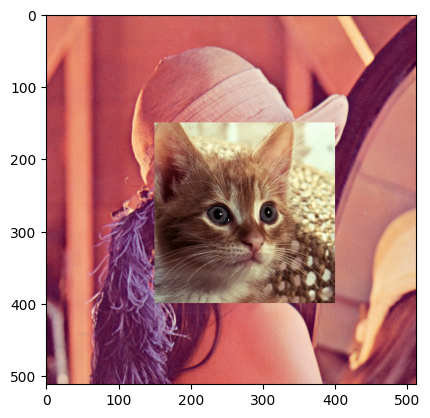

In [38]:
plt.imshow(image_lenna)                    # Hiển thị hình ảnh lenna đã được dán hình ảnh crop_image vào
plt.show()                                 # Hiển thị ảnh đã được thiết lập

We can see the method `copy()` applies to some <code>PIL</code> objects. We create two image objects, we set `new_image` to the `image`, and we use the method `copy()` for the `copy_image` object.


In [39]:
image = Image.open("cat.png")              # Mở hình ảnh cat.png sử dụng PIL và gán nó cho biến image
new_image=image                            # Gán hình ảnh gốc cho biến new_image
copy_image=image.copy()                    # Tạo một bản sao của hình ảnh gốc và gán nó cho biến copy_image

Like the array, we see that the same memory address relationship exists. For example, if we don't use the method `copy()`, the image object has the same memory address as the original PIL image object. 


In [40]:
id(image)==id(new_image)                # Sử dụng id() để kiểm tra xem image và new_image có cùng địa chỉ bộ nhớ không

True

If we use the method <code>copy()</code>, the address is different:


In [41]:
id(image)==id(copy_image)               # Sử dụng id() để kiểm tra xem image và copy_image có cùng địa chỉ bộ nhớ không

False

If we change the object <code>image</code>, <code>new_image</code> will change, but <code>copy_image</code> will remain the same:


In [42]:
image_fn= ImageDraw.Draw(im=image)                          # Tạo một đối tượng ImageDraw để vẽ trên hình ảnh gốc và gán nó cho biến image_fn
image_fn.text(xy=(0,0),text="box",fill=(0,0,0))             # Vẽ chữ "box" màu đen tại vị trí (0,0) trên hình ảnh sử dụng đối tượng ImageDraw
image_fn.rectangle(xy=shape,fill="red")                     # Vẽ một hình chữ nhật màu đỏ trên hình ảnh tại vị trí xác định bởi shape

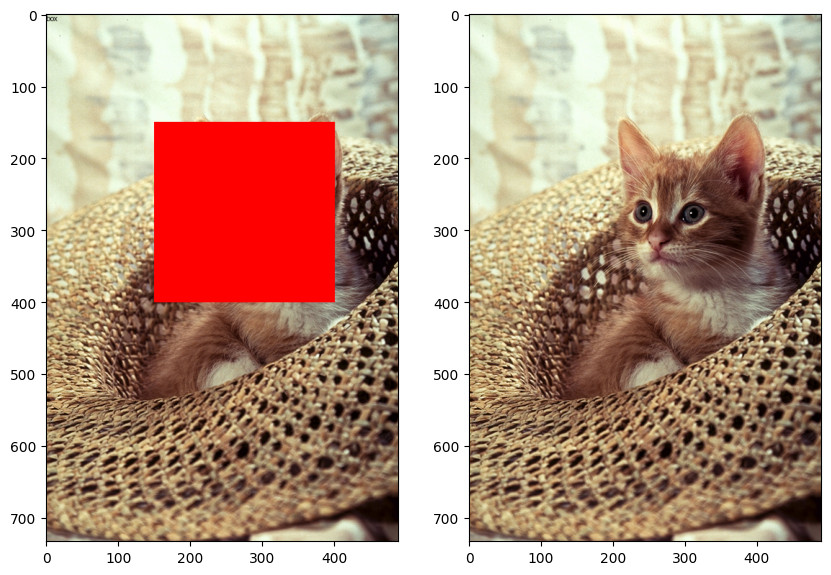

In [43]:
plt.figure(figsize=(10,10))       # Thiết lập hình ảnh mới với kích thước 10x10 inch
plt.subplot(121)                  # Thiết lập lưới con với 1 hàng và 2 cột, chọn vị trí đầu tiên
plt.imshow(new_image)             # Hiển thị hình ảnh new_image
plt.subplot(122)                  # Chọn vị trí thứ hai trong lưới con
plt.imshow(copy_image)            # Hiển thị hình ảnh copy_image
plt.show()                        # Hiển thị cả hai hình ảnh đã được thiết lập

### Question 1:
Use the image `baboon.png` from this lab or take any image you like.

Open the image and create a PIL Image object called `im`, flip `im` and create an image called `im_flip`. Mirror `im` and create an image called `im_mirror`. Finally, plot both images.


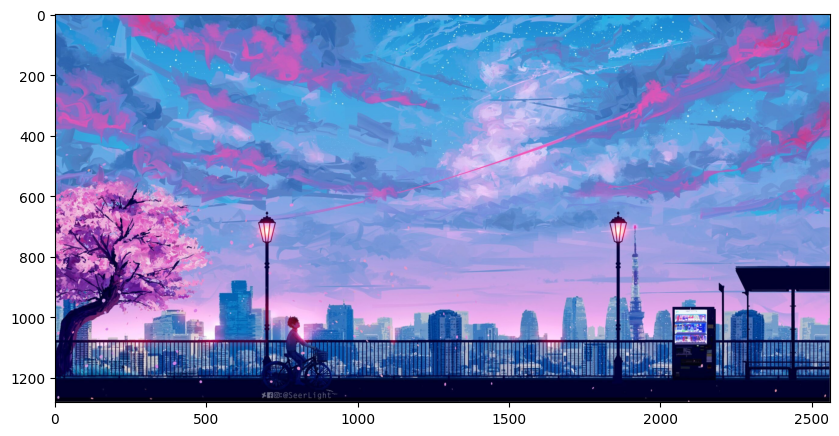

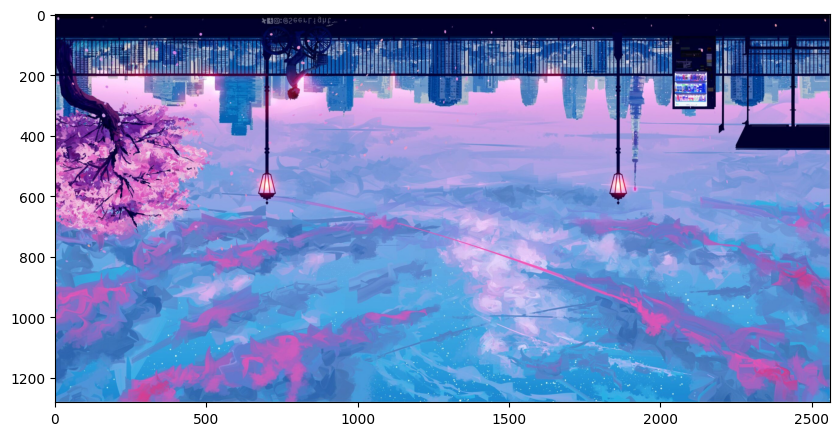

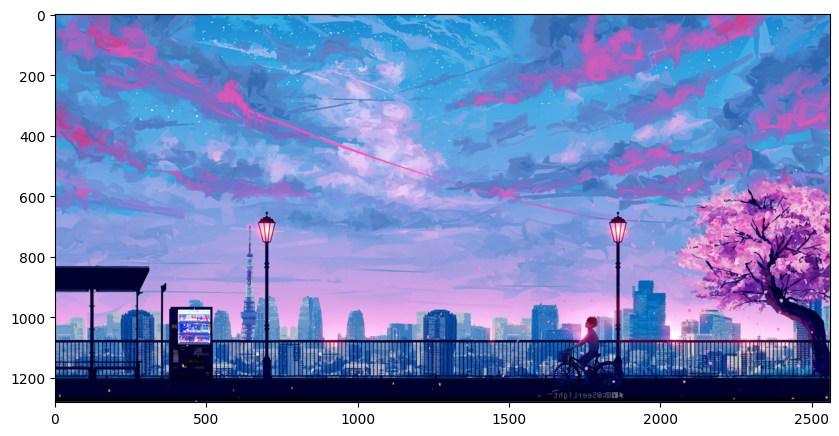

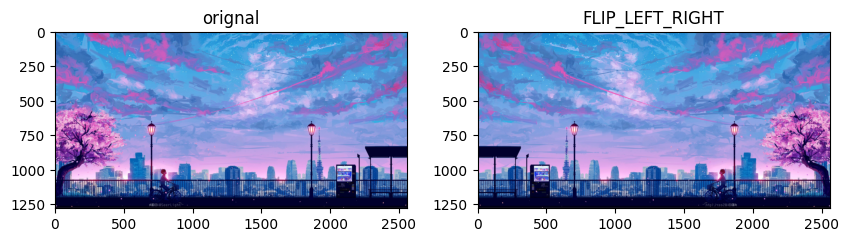

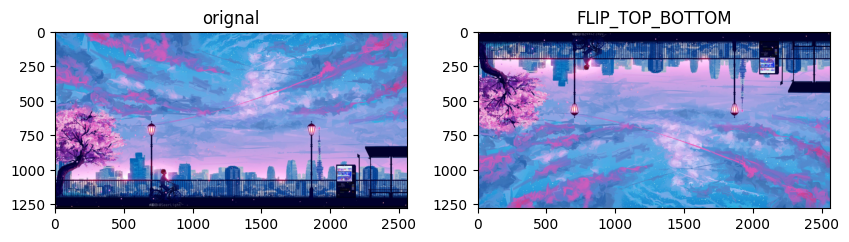

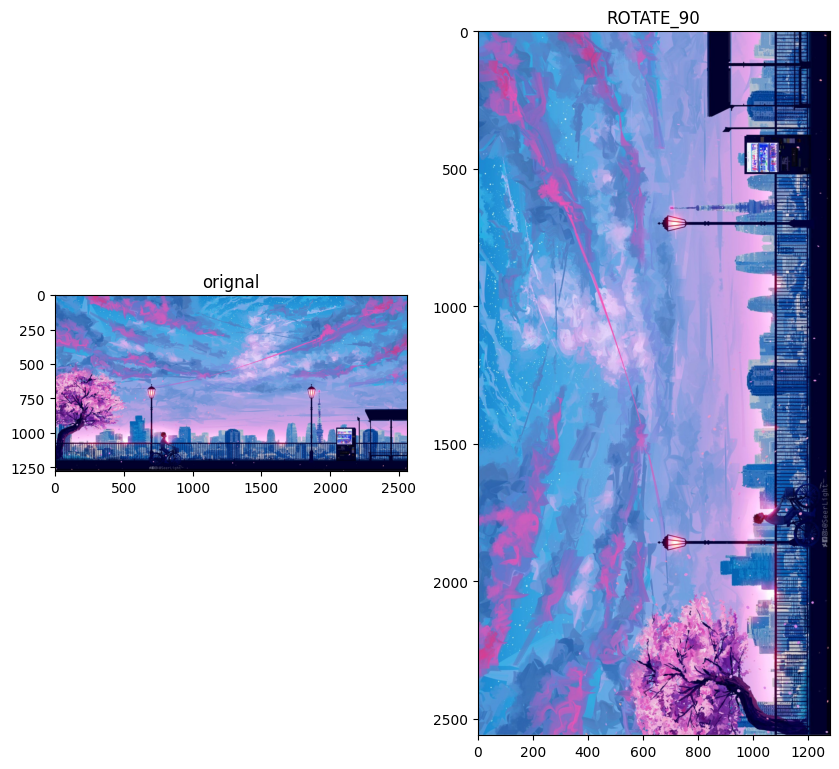

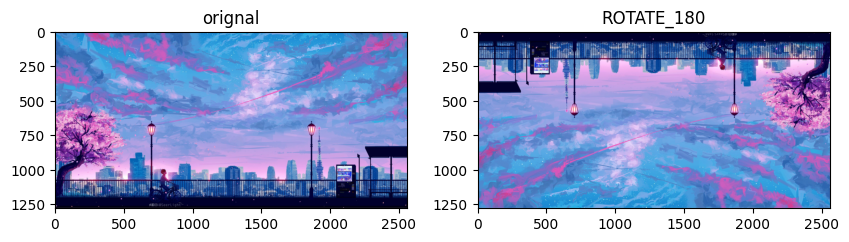

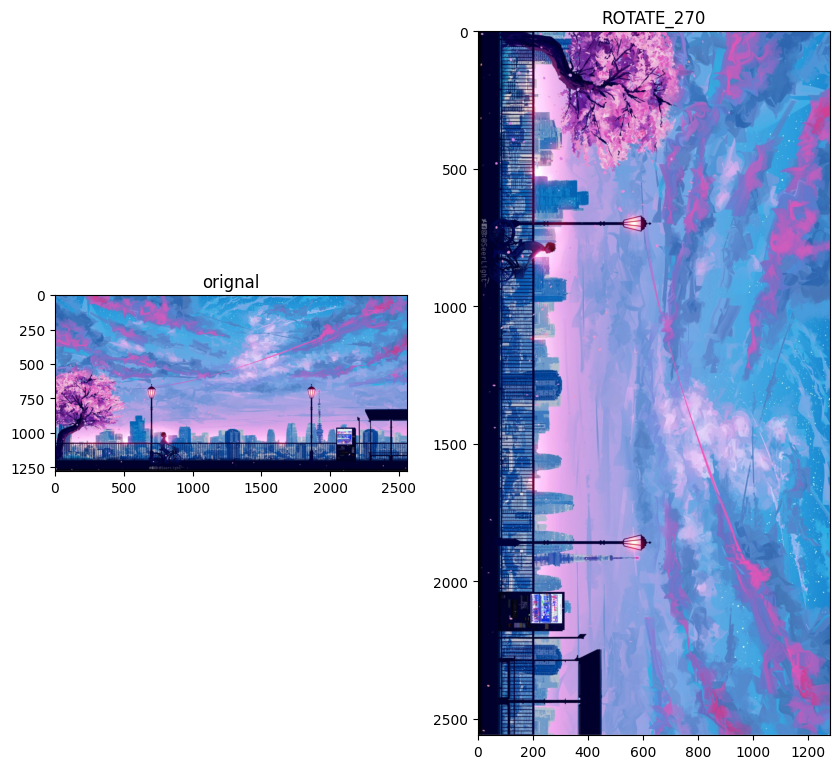

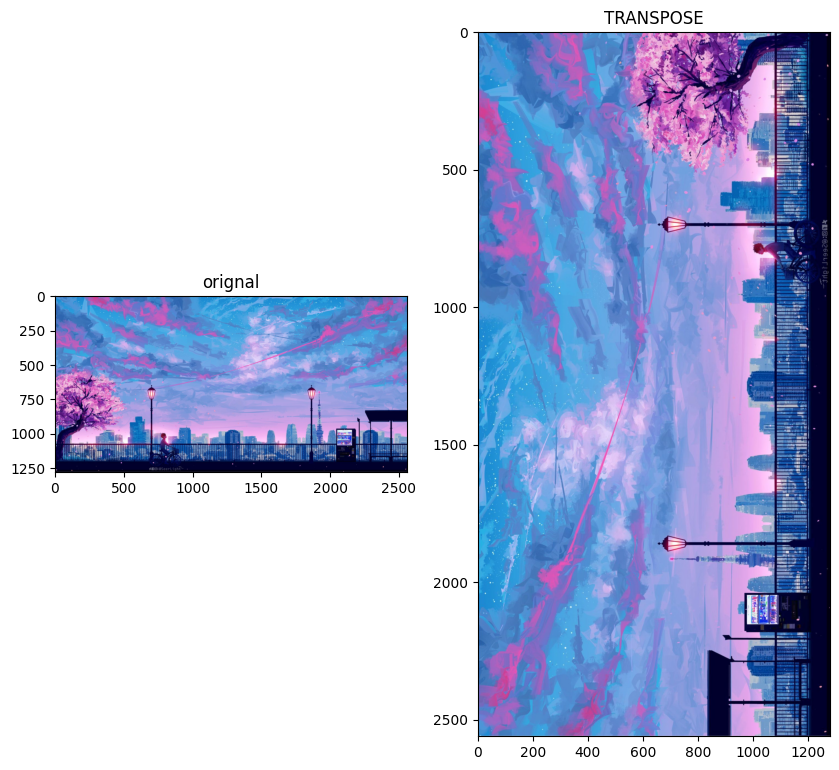

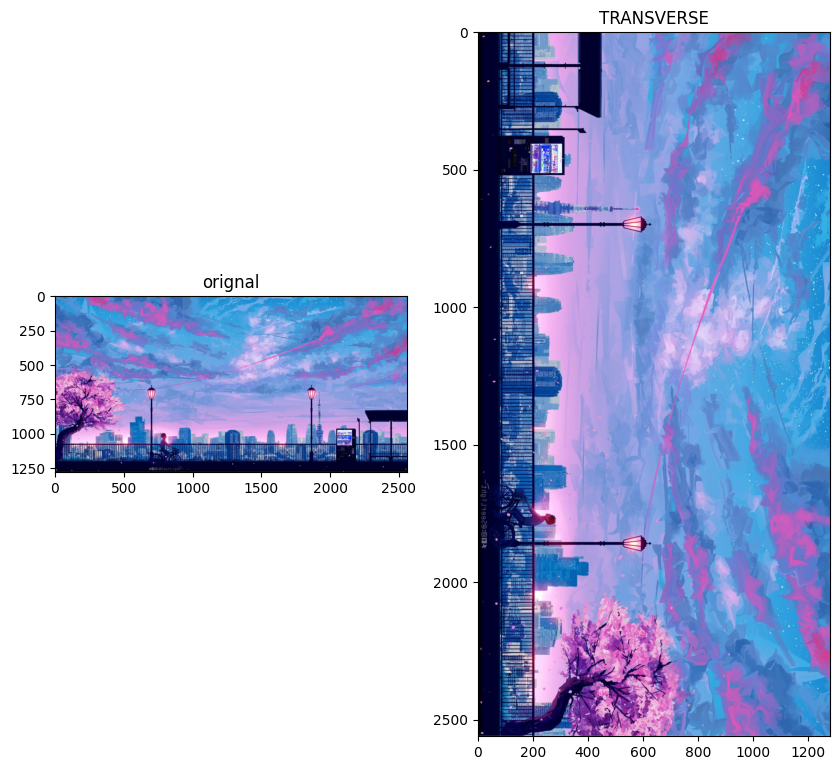

In [44]:
# write your script here
from PIL import Image, ImageOps
import matplotlib.pyplot as plt

im = Image.open('Riding_Alone.png')
plt.figure(figsize=(10,10))
plt.imshow(im)
plt.show()

# Flip the im
im_flip = ImageOps.flip(im)
plt.figure(figsize=(10,10))
plt.imshow(im_flip)
plt.show()

# Mirror the im
im_mirror = ImageOps.mirror(im)
plt.figure(figsize=(10,10))
plt.imshow(im_mirror)
plt.show()

# Plot the im
for key, values in flip.items():
    plt.figure(figsize=(10,10))
    plt.subplot(1,2,1)
    plt.imshow(im)
    plt.title("orignal")
    plt.subplot(1,2,2)
    plt.imshow(im.transpose(values))
    plt.title(key)
    plt.show()

Double-click **here** for a hint.

<!-- The hint is below:

im_flip = ImageOps.flip(im)
im_mirror = ImageOps.mirror(im)

-->


Double-click **here** for the solution.

<!-- The answer is below:

im = Image.open("lenna.png")

im_flip = ImageOps.flip(im)
plt.figure(figsize=(5,5))
plt.imshow(im_flip)
plt.show()

im_mirror = ImageOps.mirror(im)
plt.figure(figsize=(5,5))
plt.imshow(im_mirror)
plt.show()

-->


# References 


[1]  Images were taken from: https://homepages.cae.wisc.edu/~ece533/images/
    
[2]  <a href='https://pillow.readthedocs.io/en/stable/index.html'>Pillow Docs</a>

[3]  <a href='https://opencv.org/'>Open CV</a>

[4] Gonzalez, Rafael C., and Richard E. Woods. "Digital image processing." (2017).


<!--<h2>Change Log</h2>-->
